In [147]:
# Importa las bibliotecas necesarias
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder
import re
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score


# Lee el conjunto de datos
df = pd.read_csv('desaparecidos.csv')

#FUNCIONES
'''
Extrae la parte numerica de la cadena que introduzcas como argumento a la función'''
def extraer_numeros(cadena):
    numeros = re.findall(r'\d+', cadena)
    if numeros:
        return int(numeros[0])
    else:
        return None
'''
Convierte los string a formato fecha'''
def convertir_fecha(fecha_str):
    # Diccionario de meses en español
    meses_espanol = {
        'enero': 1,
        'febrero': 2,
        'marzo': 3,
        'abril': 4,
        'mayo': 5,
        'junio': 6,
        'julio': 7,
        'agosto': 8,
        'septiembre': 9,
        'octubre': 10,
        'noviembre': 11,
        'diciembre': 12
    }

    # Dividir la cadena y obtener día, mes y año
    partes_fecha = fecha_str.split()

    try:
        dia = int(partes_fecha[0])
        mes = meses_espanol[partes_fecha[2].lower()]
        anio = int(partes_fecha[4])
        # Crear un objeto datetime
        fecha = datetime(anio, mes, dia)
        return fecha
    except (ValueError, IndexError, KeyError):
        raise ValueError("Formato de fecha incorrecto")

def provincia(texto):
    prov={'Álava': 1, 'Albacete': 2, 'Alicante': 3, 'Almería': 4, 'Asturias': 5, 'Ávila': 6, 'Badajoz': 7, 'Barcelona': 8, 'Burgos': 9, 'Cáceres': 10, 'Cádiz': 11, 'Cantabria': 12, 'Castellón': 13, 'Real': 14, 'Córdoba': 15, 'Cuenca': 16, 'Girona': 17, 'Granada': 18, 'Guadalajara': 19, 'Gipuzkoa': 20, 'Huelva': 21, 'Huesca': 22, 'Baleares': 23, 'Jaén': 24, 'Coruña': 25, 'Rioja': 26, 'Palmas': 27, 'León': 28, 'Lleida': 29, 'Lugo': 30, 'Madrid': 31, 'Málaga': 32, 'Murcia': 33, 'Navarra': 34, 'Ourense': 35, 'Palencia': 36, 'Pontevedra': 37, 'Salamanca': 38, 'Tenerife': 39, 'Segovia': 40, 'Sevilla': 41, 'Soria': 42, 'Tarragona': 43, 'Teruel': 44, 'Toledo': 45, 'Valenciana': 46, 'Valladolid': 47, 'Bizkaia': 48, 'Zamora': 49, 'Zaragoza': 50}
    caracteres_a_eliminar = r':.,;-_'
    # Utilizar re.sub para eliminar los caracteres
    texto_sin_caracteres = re.sub('[' + re.escape(caracteres_a_eliminar) + ']', '', texto)
    for i in texto_sin_caracteres.split(' '):
        if i.title() in prov.keys():
            return prov[i.title()]




In [148]:



# Crear el DataFrame desde el CSV
df = pd.read_csv('desaparecidos.csv')


# Aplicar la función a la columna 'DESAPARECE'
df['DESAPARECE'] = df['DESAPARECE'].apply(convertir_fecha)

# Aplicar la función a la columna 'FECHA NACIMIENTO'
df['FECHA NACIMIENTO'] = df['FECHA NACIMIENTO'].apply(convertir_fecha)

df['EDAD AL DESAPARECER']=df['EDAD AL DESAPARECER'].apply(extraer_numeros)
df['EDAD ACTUAL']=df['EDAD ACTUAL'].apply(extraer_numeros)

df['LUGAR DE DESAPARICIÓN']=df['LUGAR DE DESAPARICIÓN'].apply(provincia)

# Guardar el DataFrame resultante en un nuevo archivo CSV
df.to_csv('desaparecidos_modificado.csv', index=False)
# Ver el DataFrame resultante

print(df.head())


                               NOMBRE DESAPARECE FECHA NACIMIENTO  \
0          LILLY ARIANNA PAPPSZILAGYI 2024-01-12       2006-10-16   
1  MICHELLE-FRANCISCA MOLINA CHINCHAY 2024-01-12       2008-11-07   
2       PAULA MARÍA DORESTE HERNÁNDEZ 2024-01-07       2008-11-20   
3        JUAN FRANCISCO UGALDE ECHAVE 2023-10-25       1967-01-26   
4  CAMILA REBECCA QUEZADA SIDORKEVICH 2021-08-29       2015-01-08   

   EDAD AL DESAPARECER  EDAD ACTUAL  LUGAR DE DESAPARICIÓN  \
0                   17           17                    4.0   
1                   15           15                   33.0   
2                   15           15                   39.0   
3                   56           56                   20.0   
4                    6            9                    8.0   

                                            imagen  
0          imagenes\LILLY ARIANNA PAPPSZILAGYI.png  
1  imagenes\MICHELLE-FRANCISCA MOLINA CHINCHAY.png  
2       imagenes\PAULA MARÍA DORESTE HERNÁNDEZ.png  


count    87.000000
mean     33.885057
std      22.072515
min       3.000000
25%      16.000000
50%      25.000000
75%      52.500000
max      84.000000
Name: EDAD ACTUAL, dtype: float64


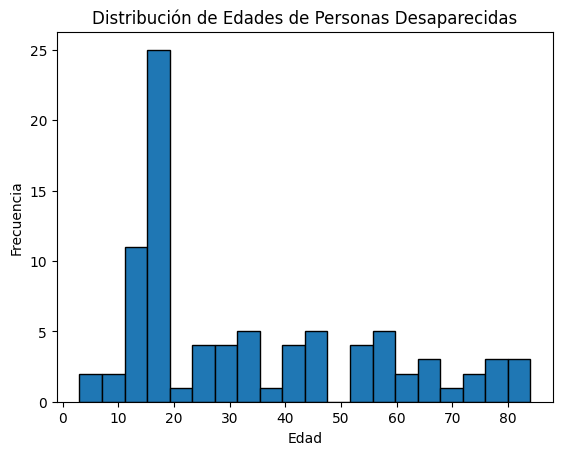

____________________LUGARES_____________________


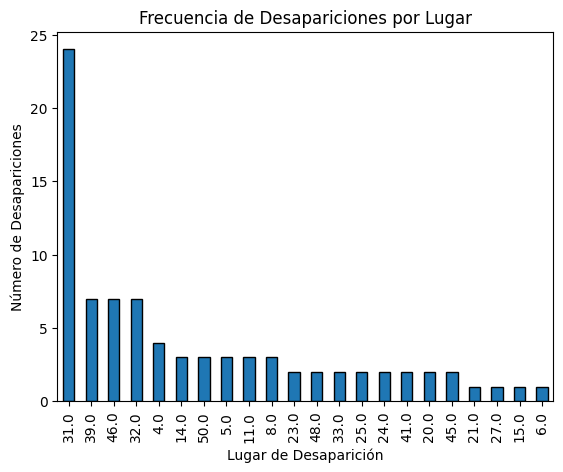

_________LUGARES Y EDAD_____________________


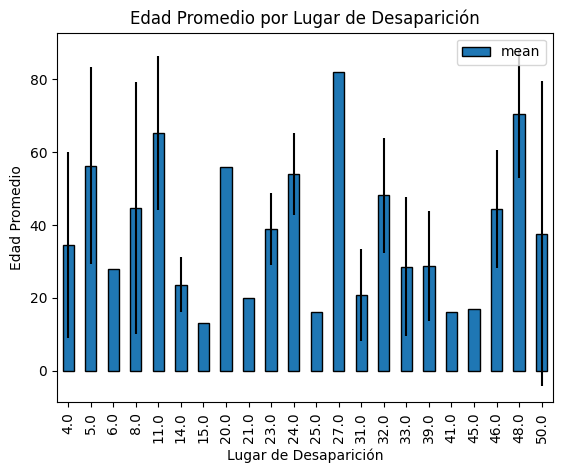

In [154]:
#Combinar 2 archivos csv
'''
# Cargar el primer DataFrame desde el primer CSV
df1 = pd.read_csv('archivo1.csv')

# Cargar el segundo DataFrame desde el segundo CSV
df2 = pd.read_csv('archivo2.csv')

# Concatenar ambos DataFrames verticalmente (uno debajo del otro)
df_combinado = pd.concat([df1, df2], ignore_index=True)

# Ahora df_combinado contiene todos los datos de ambos DataFrames
'''

# Carga el DataFrame desde el CSV
df = pd.read_csv('desaparecidos_modificado.csv')

# Estadísticas descriptivas de la edad
print(df['EDAD ACTUAL'].describe())

# Histograma de distribución de edades
plt.hist(df['EDAD ACTUAL'], bins=20, edgecolor='black')
plt.title('Distribución de Edades de Personas Desaparecidas')
plt.xlabel('Edad')
plt.ylabel('Frecuencia')
plt.show()
'''
Número total de desapariciones (count): 87
Edad promedio (mean): 33.89 años
Desviación estándar (std): 22.07 años
Edad mínima (min): 3 años
Percentil 25 (25%): 16 años
Mediana (50%): 25 años
Percentil 75 (75%): 52.5 años
Edad máxima (max): 84 años'''
print('____________________LUGARES_____________________')
# Frecuencia de desapariciones por lugar
lugares_frecuencia = df['LUGAR DE DESAPARICIÓN'].value_counts()

# Gráfico de barras
lugares_frecuencia.plot(kind='bar', edgecolor='black')
plt.title('Frecuencia de Desapariciones por Lugar')
plt.xlabel('Lugar de Desaparición')
plt.ylabel('Número de Desapariciones')
plt.show()

print('_________LUGARES Y EDAD_____________________')
# Agrupación por lugar y estadísticas de edad
edades_por_lugar = df.groupby('LUGAR DE DESAPARICIÓN')['EDAD ACTUAL'].describe()

# Gráfico de barras apiladas
edades_por_lugar.plot(kind='bar', y='mean', yerr='std', stacked=True, edgecolor='black')
plt.title('Edad Promedio por Lugar de Desaparición')
plt.xlabel('Lugar de Desaparición')
plt.ylabel('Edad Promedio')
plt.show()


Este código realiza la lectura de un archivo CSV (desaparecidos_modificado.csv) que contiene información sobre personas desaparecidas, incluyendo la ruta de la imagen asociada. Aquí está un resumen de las funciones principales:

Importación de bibliotecas: Se importan las bibliotecas necesarias, incluyendo pandas para el manejo de datos, OpenCV para procesamiento de imágenes, y matplotlib para visualización.

Lectura del archivo CSV: Se lee el archivo CSV y se carga en un DataFrame de pandas (df).

Iteración sobre filas: Se itera sobre cada fila del DataFrame para obtener la ruta de la imagen y otros datos asociados a cada persona desaparecida.

Procesamiento de imágenes: Se intenta cargar cada imagen utilizando OpenCV (cv2.imread). Si la imagen se carga correctamente, se convierte de formato BGR a RGB y se muestra utilizando matplotlib. Si hay un error durante este proceso, se imprime un mensaje de error indicando la ruta de la imagen y la descripción del error.

Este código es útil para visualizar las imágenes asociadas a las personas desaparecidas, lo que puede ser útil para inspeccionar manualmente las imágenes y obtener información visual sobre los casos. Sin embargo, para tareas más avanzadas como reconocimiento facial o comparación de imágenes, pueden ser necesarios enfoques más especializados.








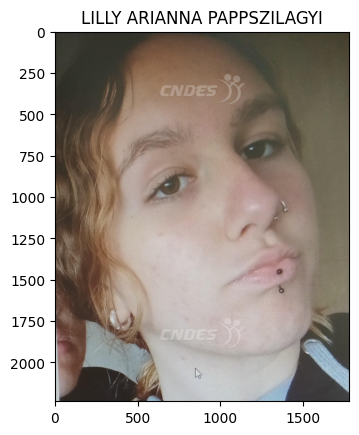

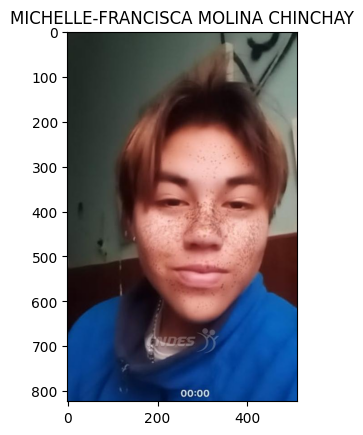

Error: No se pudo cargar la imagen: imagenes\PAULA MARÍA DORESTE HERNÁNDEZ.png


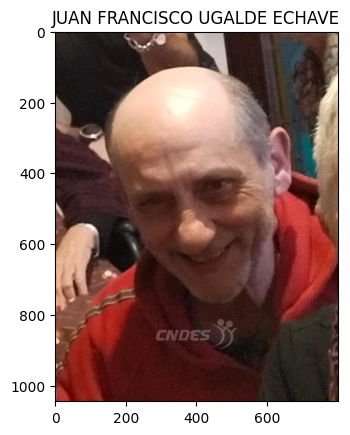

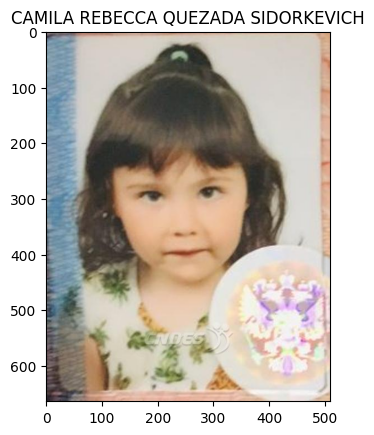

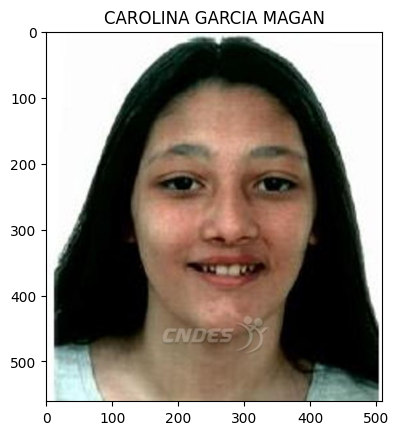

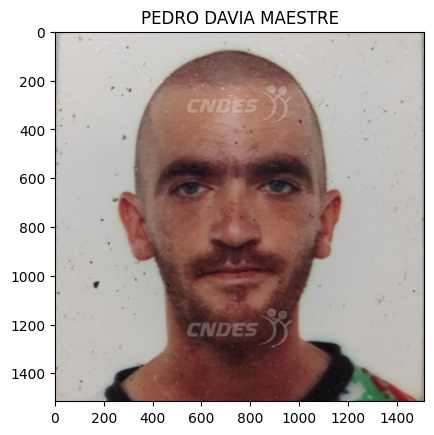

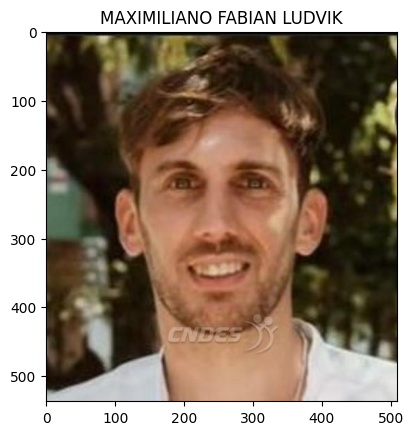

...

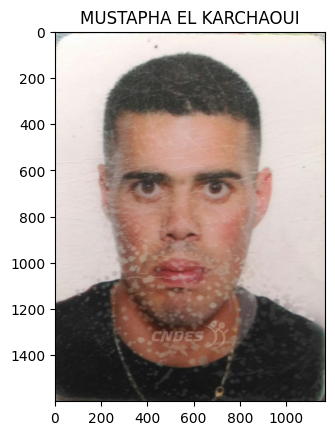

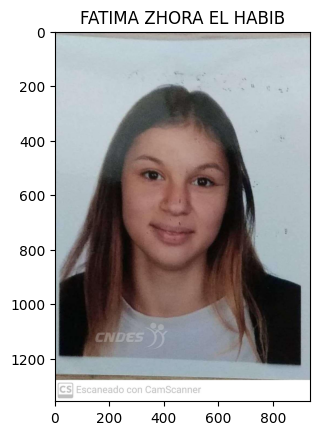

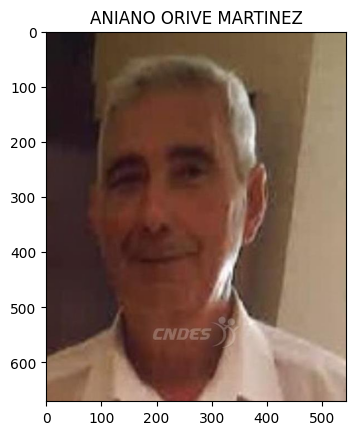

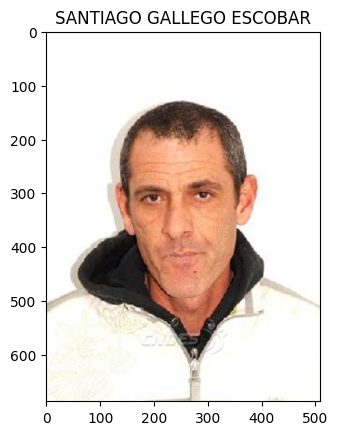

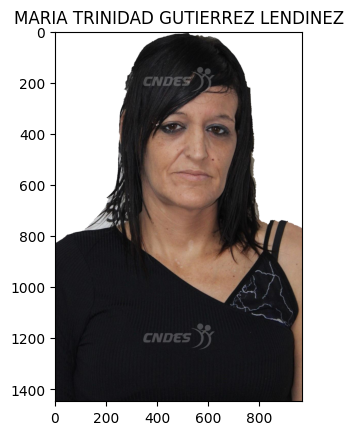

Error: No se pudo cargar la imagen: imagenes\NOELIA RAFET NUÑEZ.png


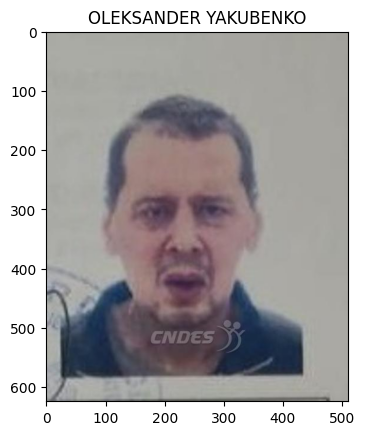

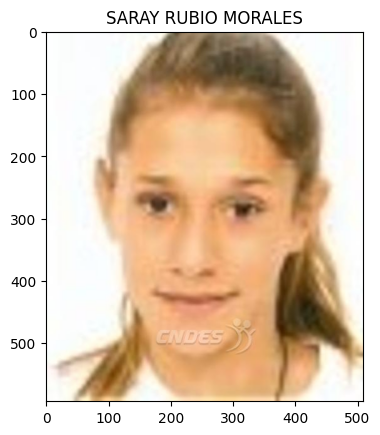

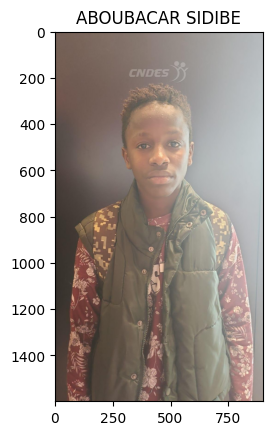

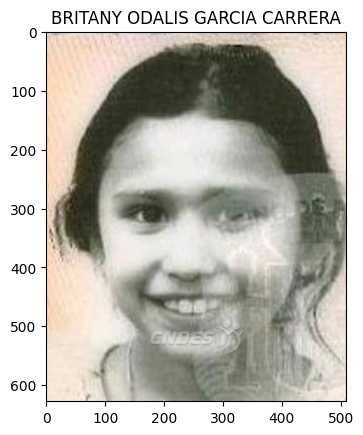

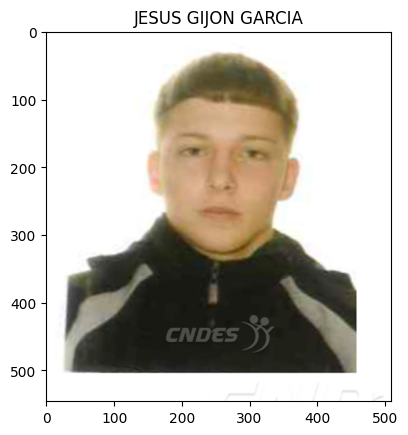

Error: No se pudo cargar la imagen: imagenes\NAIALA BENÍTEZ QUIROS.png


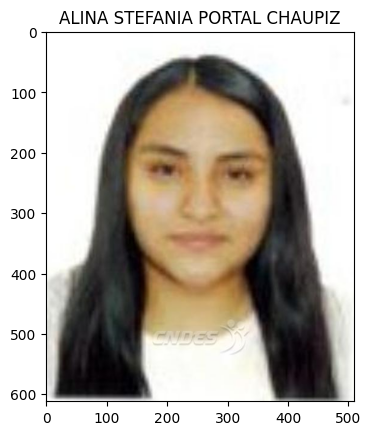

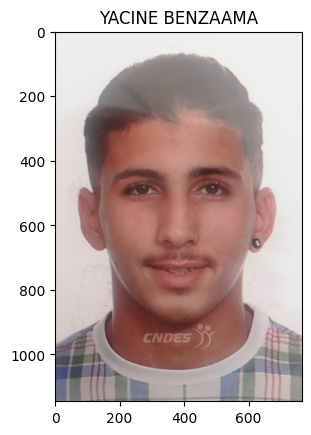

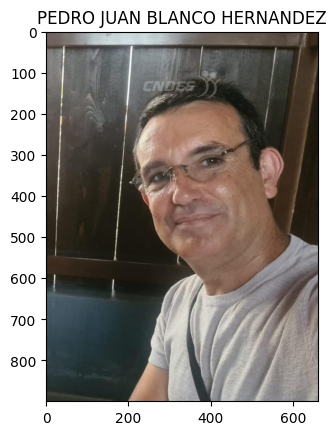

Error: No se pudo cargar la imagen: imagenes\LUCIO CENTURION ACUÑA.png
Error: No se pudo cargar la imagen: imagenes\DAMIAN LASTRA FERNÁNDEZ.png


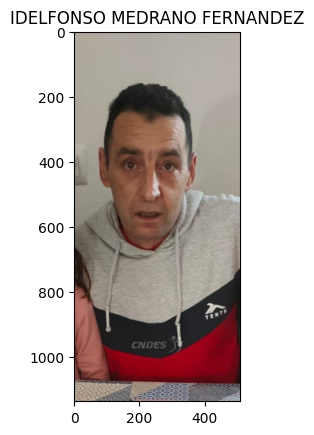

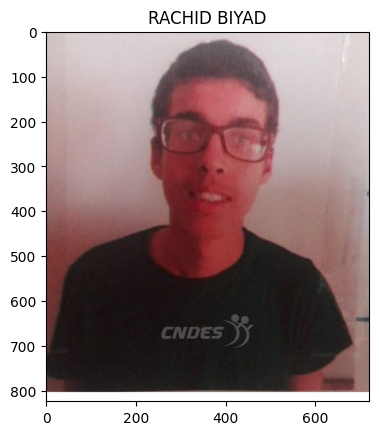

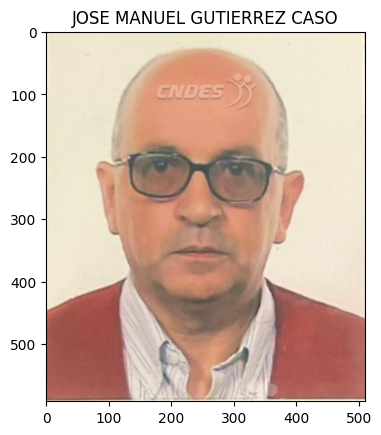

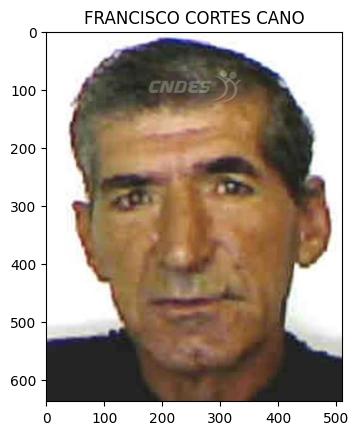

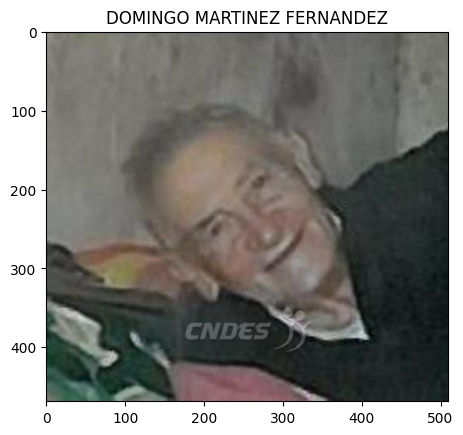

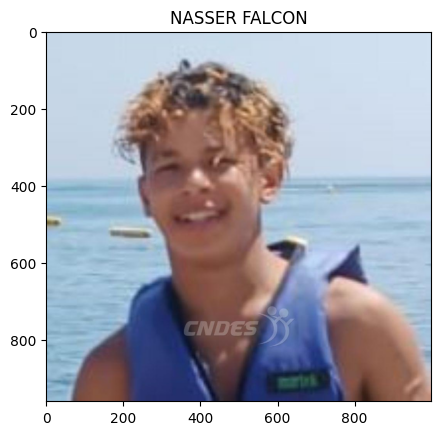

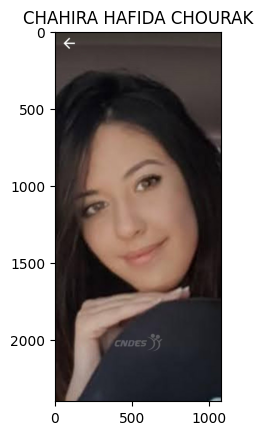

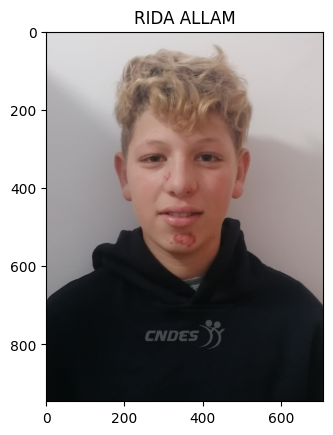

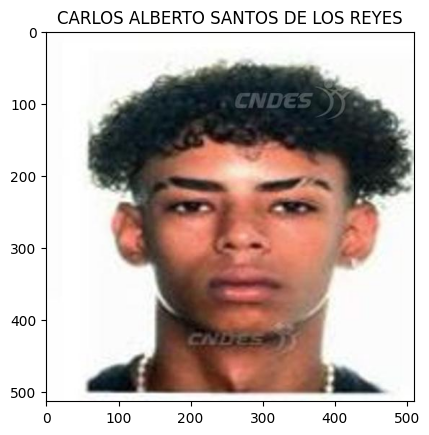

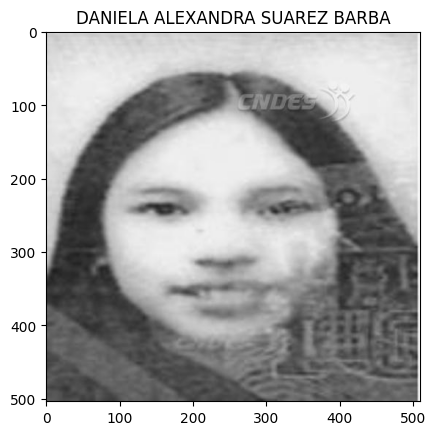

Error: No se pudo cargar la imagen: imagenes\LUCIO CENTURION ACUÑA.png


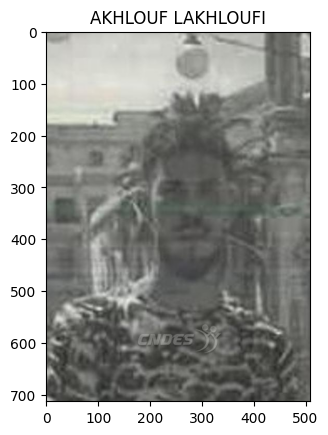

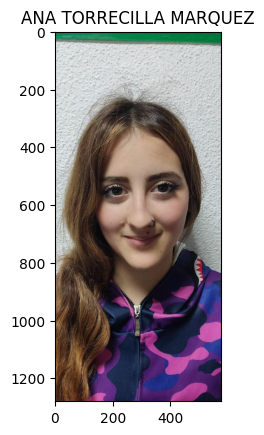

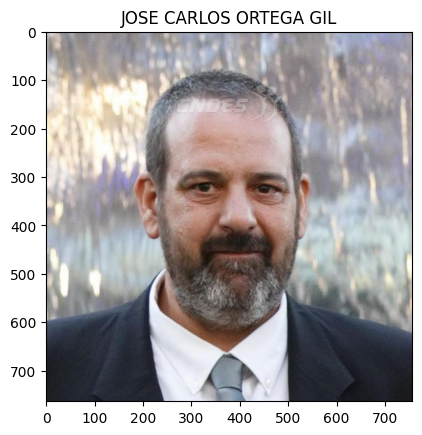

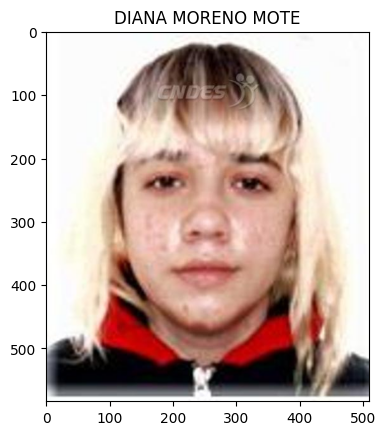

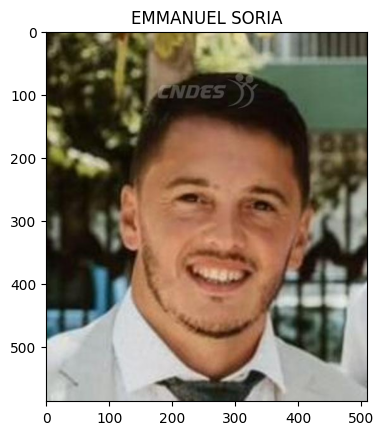

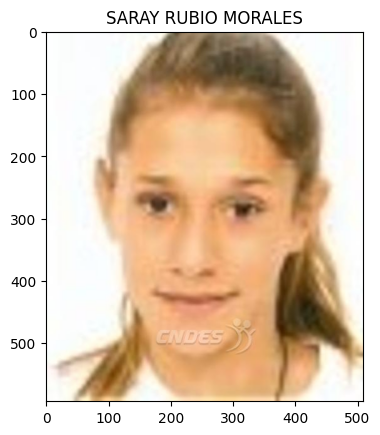

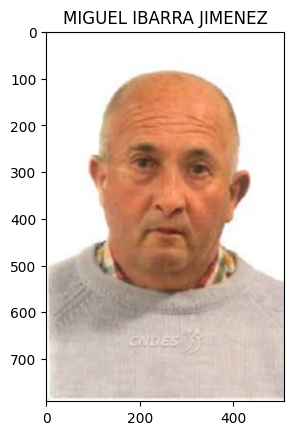

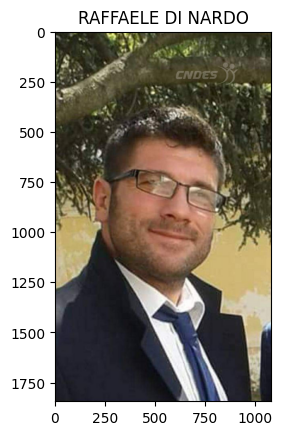

Error: No se pudo cargar la imagen: imagenes\FRANCISCO JOSÉ AGÜERA CLAVIJO.png


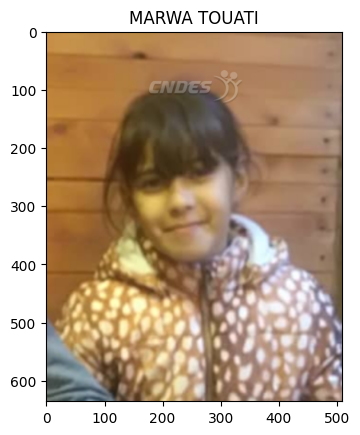

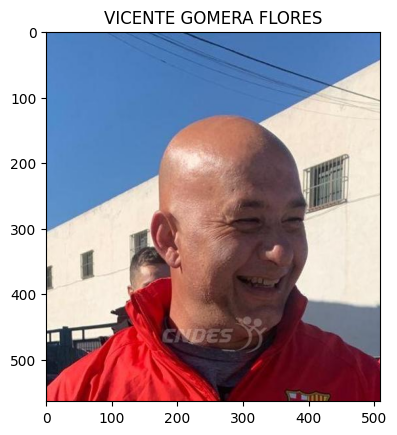

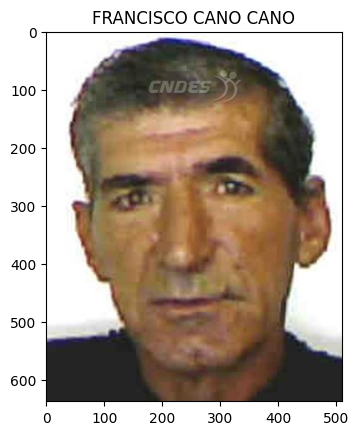

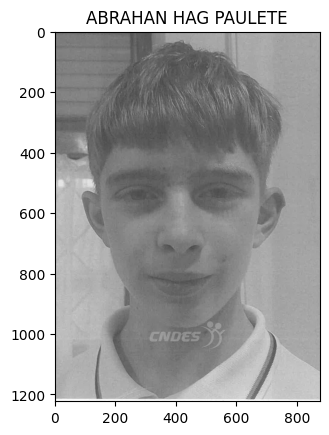

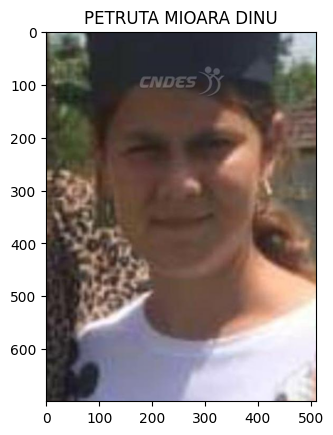

...

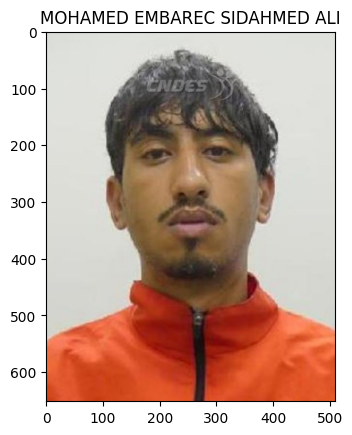

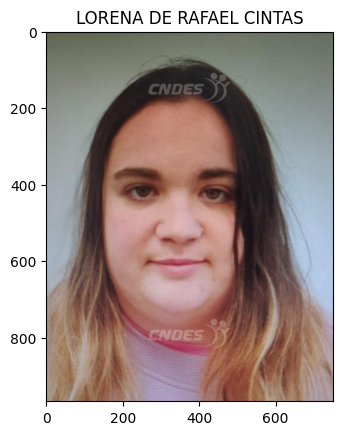

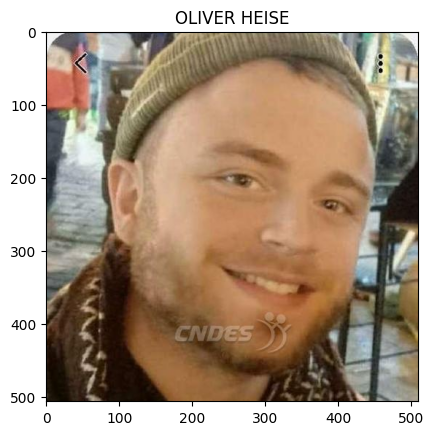

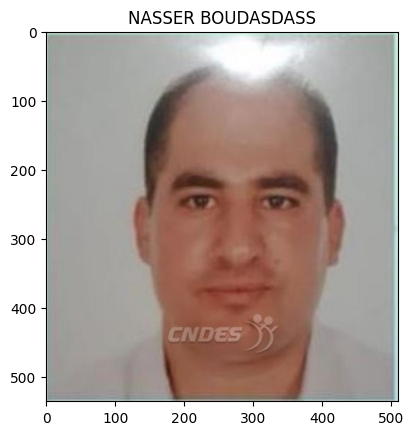

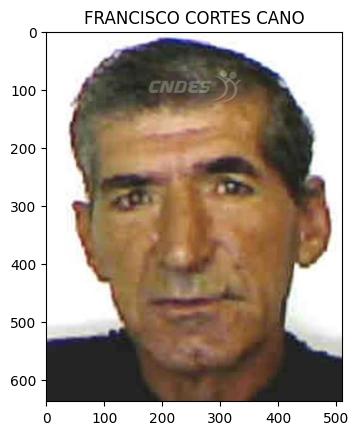

Error: No se pudo cargar la imagen: imagenes\DAMIAN LASTRA FERNÁNDEZ.png


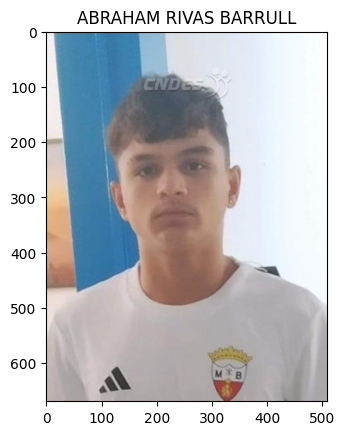

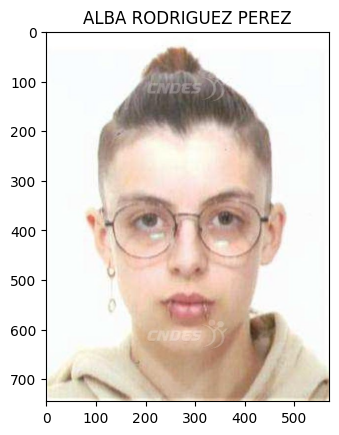

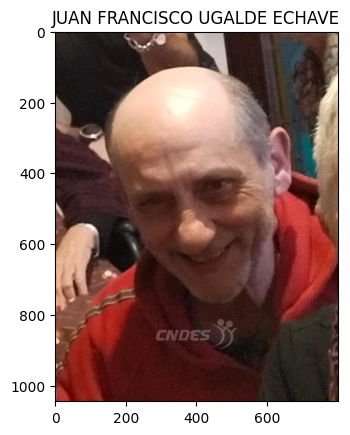

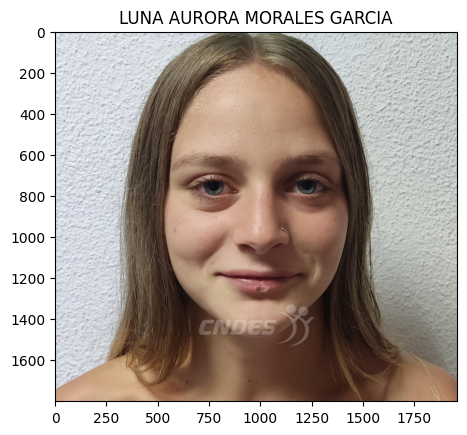

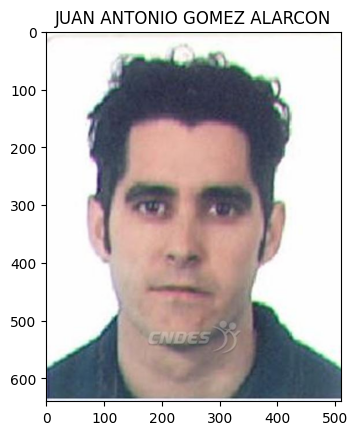

...

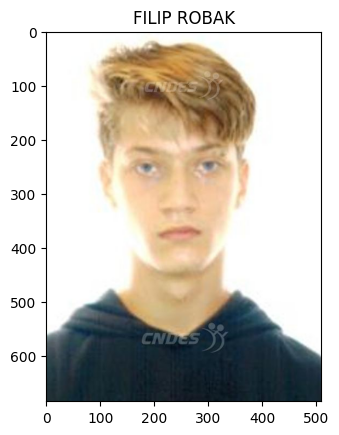

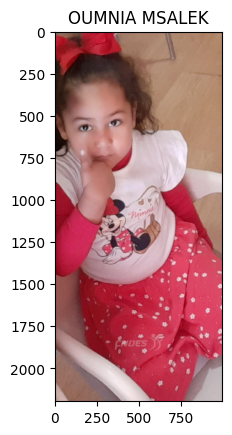

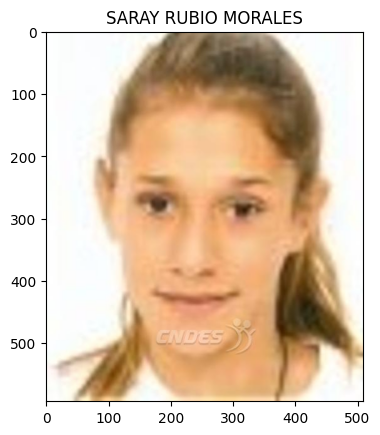

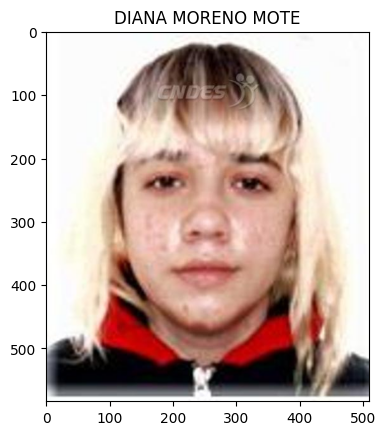

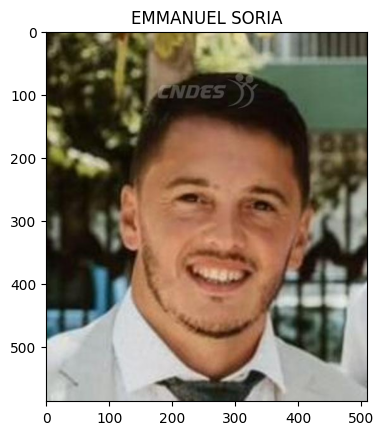

Error: No se pudo cargar la imagen: imagenes\SARA MICHELLE JORDAN MONTAÑO.png


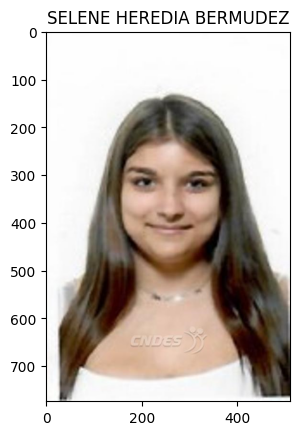

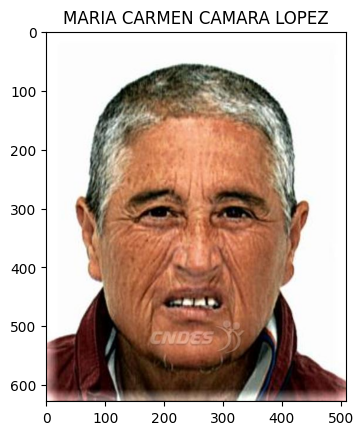

Error: No se pudo cargar la imagen: imagenes\MOISES SÁNCHEZ ESCRIBANO.png


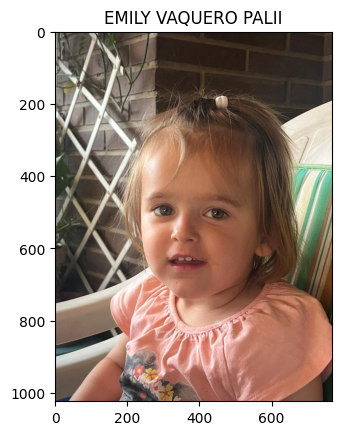

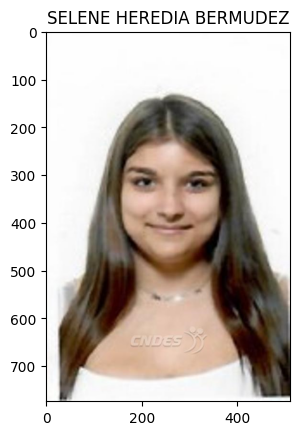

In [138]:
import pandas as pd
import cv2
from matplotlib import pyplot as plt

# Lee el archivo CSV
df = pd.read_csv('desaparecidos_modificado.csv')

# Itera sobre las filas del DataFrame
for index, row in df.iterrows():
    # Obtiene la ruta de la imagen
    img_path = row['imagen']

    try:
        # Intenta cargar la imagen
        image = cv2.imread(img_path)

        # Verifica si la imagen se cargó correctamente
        if image is not None:
            # Convierte la imagen de BGR a RGB (OpenCV carga las imágenes en formato BGR por defecto)
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            # Muestra la imagen
            plt.imshow(image_rgb)
            plt.title(row['NOMBRE'])
            plt.show()
        else:
            print(f"Error: No se pudo cargar la imagen: {img_path}")

    except Exception as e:
        print(f"Error al procesar la imagen {img_path}: {str(e)}")


Este código realiza la comparación de imágenes de personas almacenadas en un archivo CSV (desaparecidos_modificado.csv) con imágenes de otra carpeta (imagenes_02). Aquí hay un resumen de las principales funciones del código:

Importación de bibliotecas: Se importan las bibliotecas necesarias, incluyendo pandas para el manejo de datos, OpenCV para procesamiento de imágenes, y matplotlib para visualización.

Lectura del archivo CSV: Se lee un archivo CSV que contiene información sobre personas desaparecidas, incluyendo la ruta de la imagen asociada.

Definición de la carpeta de comparación: Se especifica la carpeta (imagenes_02) que contiene las imágenes con las cuales se compararán las imágenes del CSV.

Verificación de existencia de carpeta: Se verifica si la carpeta de comparación existe. Si no existe, se muestra un mensaje de error.

Bucle de procesamiento: Se itera sobre cada fila del DataFrame del CSV, extrayendo la ruta de la imagen y el nombre de la persona.

Procesamiento de imágenes: Para cada imagen en el CSV, se carga la imagen y se itera sobre las imágenes en la carpeta de comparación.

Comparación de imágenes: Utilizando el método cv2.matchTemplate, se compara la imagen del CSV con cada imagen en la carpeta. Se establece un umbral de similitud (umbral_similitud) y, si la similitud es superior a este umbral, se imprime un mensaje indicando la persona, la imagen y la similitud.

Manejo de errores: Se capturan y manejan posibles errores durante el procesamiento de las imágenes.

Este código es un ejemplo básico de comparación de imágenes, pero ten en cuenta que para tareas más avanzadas de identificación de personas, podrías considerar técnicas más especializadas, como reconocimiento facial o aprendizaje automático. Además, es importante ajustar el umbral de similitud según las necesidades específicas del proyecto.

In [146]:
import pandas as pd
import cv2
import os
from matplotlib import pyplot as plt

# Lee el archivo CSV
df = pd.read_csv('desaparecidos_modificado.csv')

# Ruta de la carpeta con las imágenes a comparar
carpeta_a_comparar = 'imagenes_02'

# Verificar si la carpeta existe
if not os.path.exists(carpeta_a_comparar):
    print(f"Error: La carpeta {carpeta_a_comparar} no existe.")
else:
    # Continuar con el bucle de procesamiento
    for index, row in df.iterrows():
        img_path = row['imagen']
        nombre_persona = row['NOMBRE']

        try:
            image = cv2.imread(img_path)
            if image is not None:
                # Iterar sobre las imágenes en la carpeta_a_comparar
                for filename in os.listdir(carpeta_a_comparar):
                    img_comparar_path = os.path.join(carpeta_a_comparar, filename)
                    img_comparar = cv2.imread(img_comparar_path)

                    # Verificar las dimensiones antes de intentar la comparación
                    if img_comparar is not None and image.shape[0] >= img_comparar.shape[0] and image.shape[1] >= img_comparar.shape[1]:
                        # Comparar las imágenes usando cv2.matchTemplate
                        result = cv2.matchTemplate(image, img_comparar, cv2.TM_CCOEFF_NORMED)
                        similarity = result[0][0]

                        # Establecer un umbral (ajusta este valor según tus necesidades)
                        umbral_similitud = 0.8

                        if similarity > umbral_similitud:
                            print(f"Persona: {nombre_persona} - Imagen: {filename} - Similitud: {similarity}")

        except Exception as e:
            print(f"Error al procesar la imagen {img_path}: {str(e)}")


Persona: MARIA DEL PILAR OCAMPO DEL RIEGO - Imagen: descargar (1).png - Similitud: 0.9999998211860657
Persona: MARIA DEL PILAR OCAMPO DEL RIEGO - Imagen: descargar (1).png - Similitud: 0.9999998211860657
Persona: EMILIO UGARTE ARRUZA - Imagen: descargar (4).png - Similitud: 0.9999991059303284
